In [24]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
from imgaug import augmenters as iaa
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000 # use 1000 when you just want to explore new idea, use -1 for full train

In [45]:
# Pre Process the Images based on the ImageNet pre-trained model Image transformation
def pre_process(img):
    img[:,:,0] = img[:,:,0] - 103.939
    img[:,:,1] = img[:,:,0] - 116.779
    img[:,:,2] = img[:,:,0] - 123.68
    return img

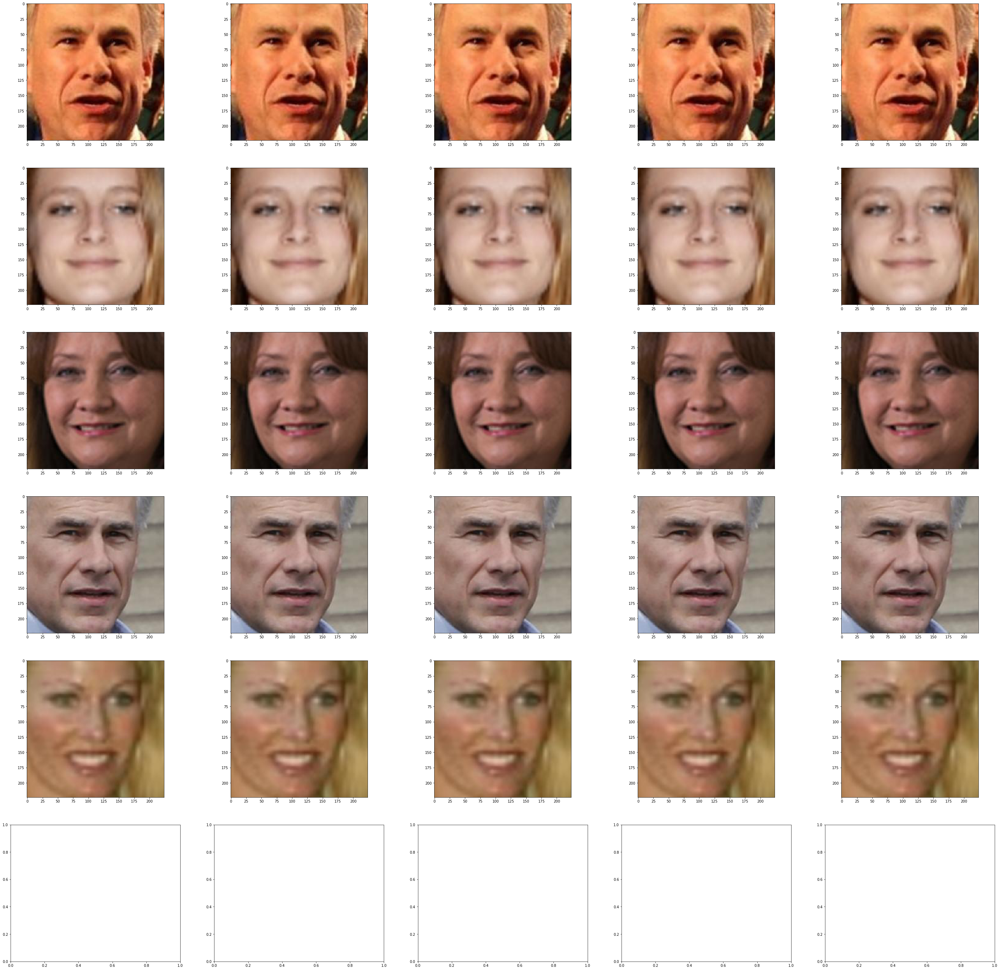

In [47]:

import matplotlib.image as mpimg

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(5):          
    for j in range(5):  
        img = mpimg.imread('faces/' + files[i])             
        ax[i, j].imshow(img)


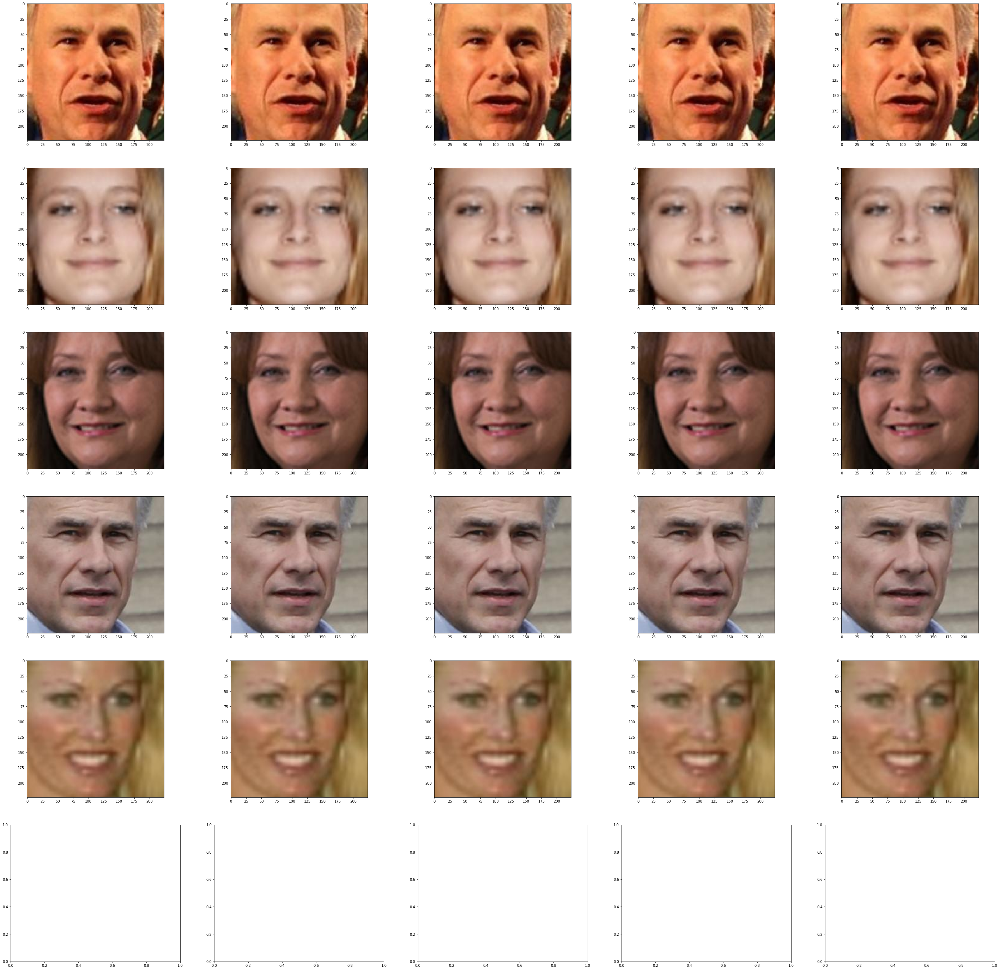

In [51]:
fig, ax = plt.subplots(5, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(5):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # img = pre_process(img)
        ax[i, j].imshow(img)


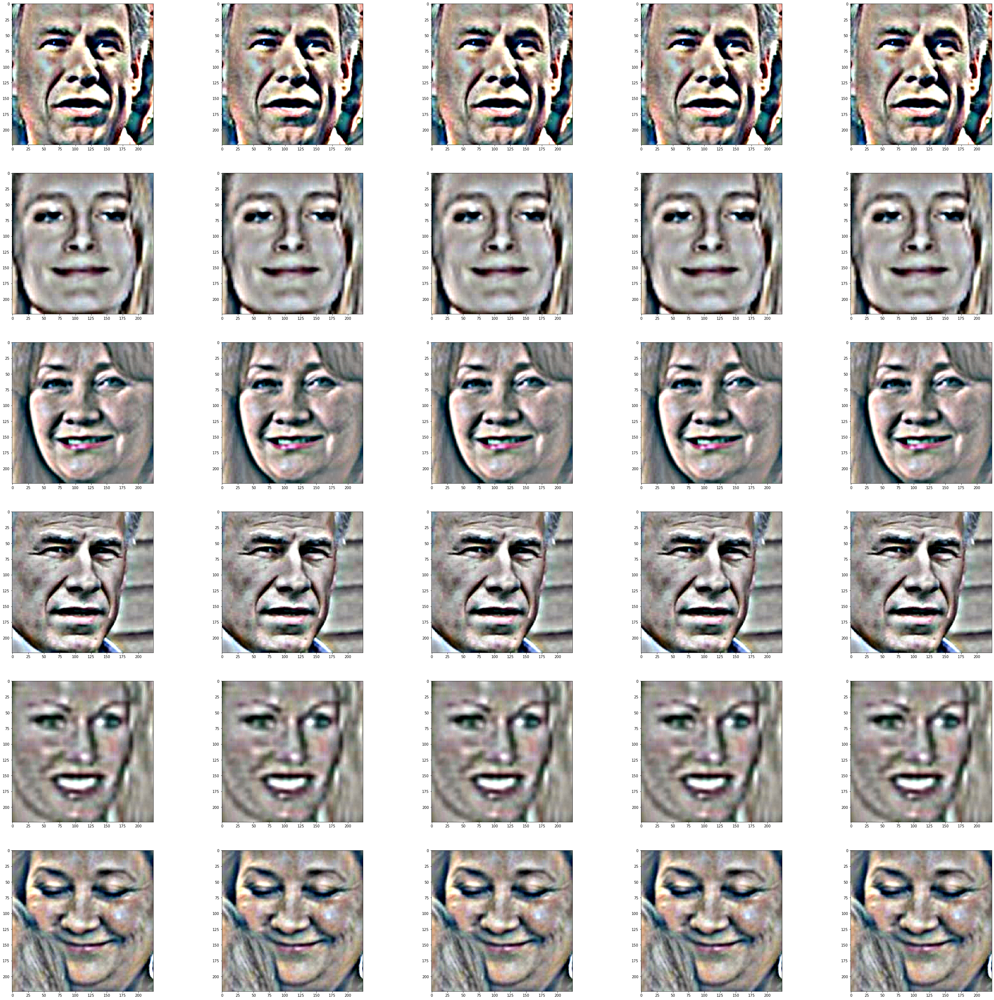

In [54]:
fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.addWeighted ( img, 4, cv2.GaussianBlur( img , (0,0) , 10) ,-4 ,128)
        ax[i, j].imshow(img)

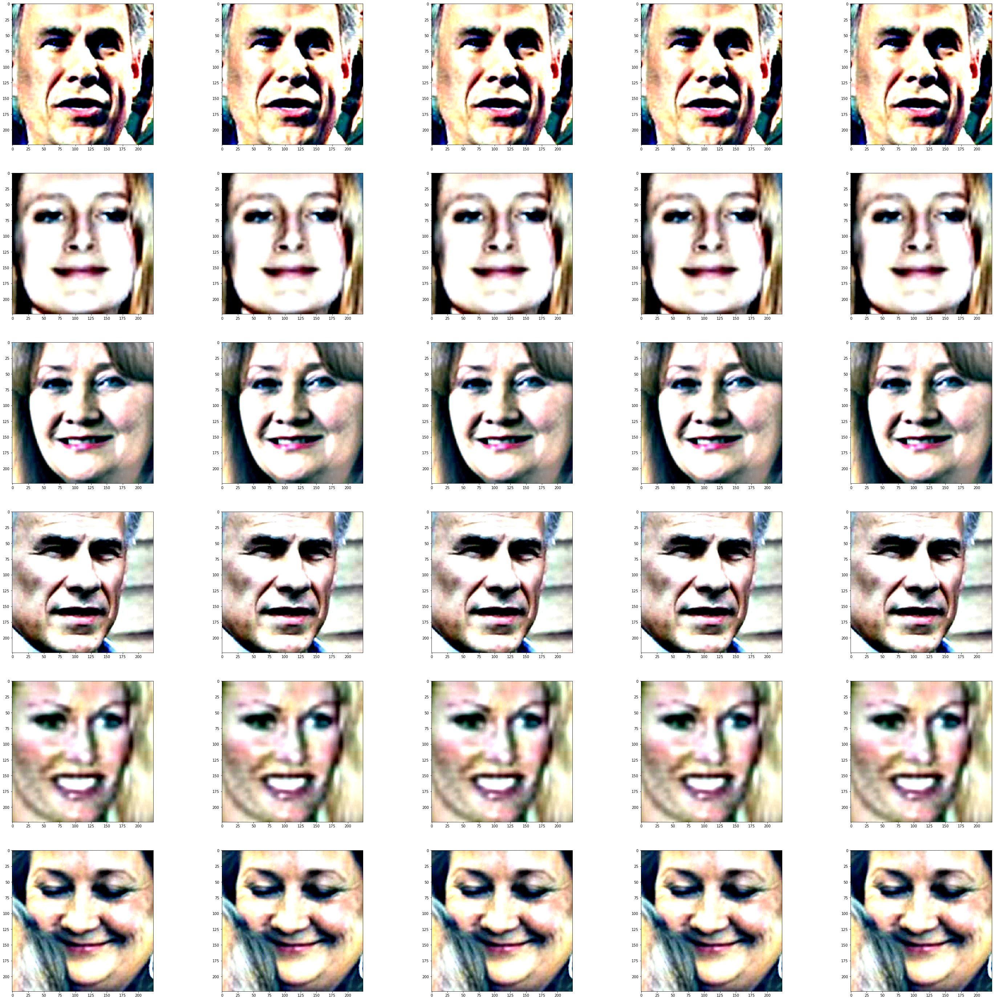

In [55]:
fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.addWeighted ( img, 4, cv2.GaussianBlur( img , (0,0) , 30) ,-4 ,128)
        ax[i, j].imshow(img)

W0711 16:13:55.212134 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 16:13:55.215140 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 16:13:55.217741 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 16:13:55.220454 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 16:13:55.223233 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 16:13:55.225894 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 16:13:55.228621 139695

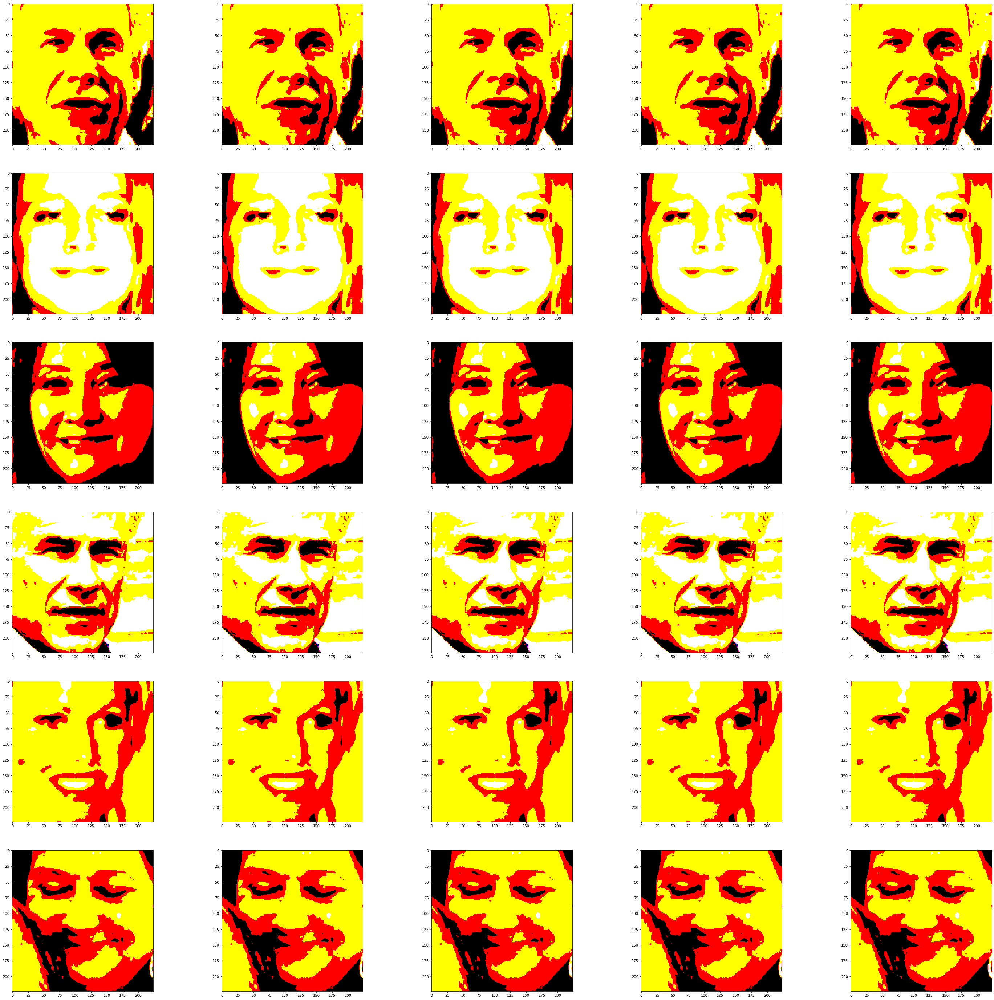

In [98]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))
        img = np.array(img).astype(np.float)
        img = preprocess_input(img,version=2)
        ax[i, j].imshow(img)

W0711 14:43:41.869287 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 14:43:41.937026 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 14:43:42.008826 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 14:43:42.078300 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 14:43:42.146360 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 14:43:42.217455 139695443900224 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0711 14:43:42.286363 139695

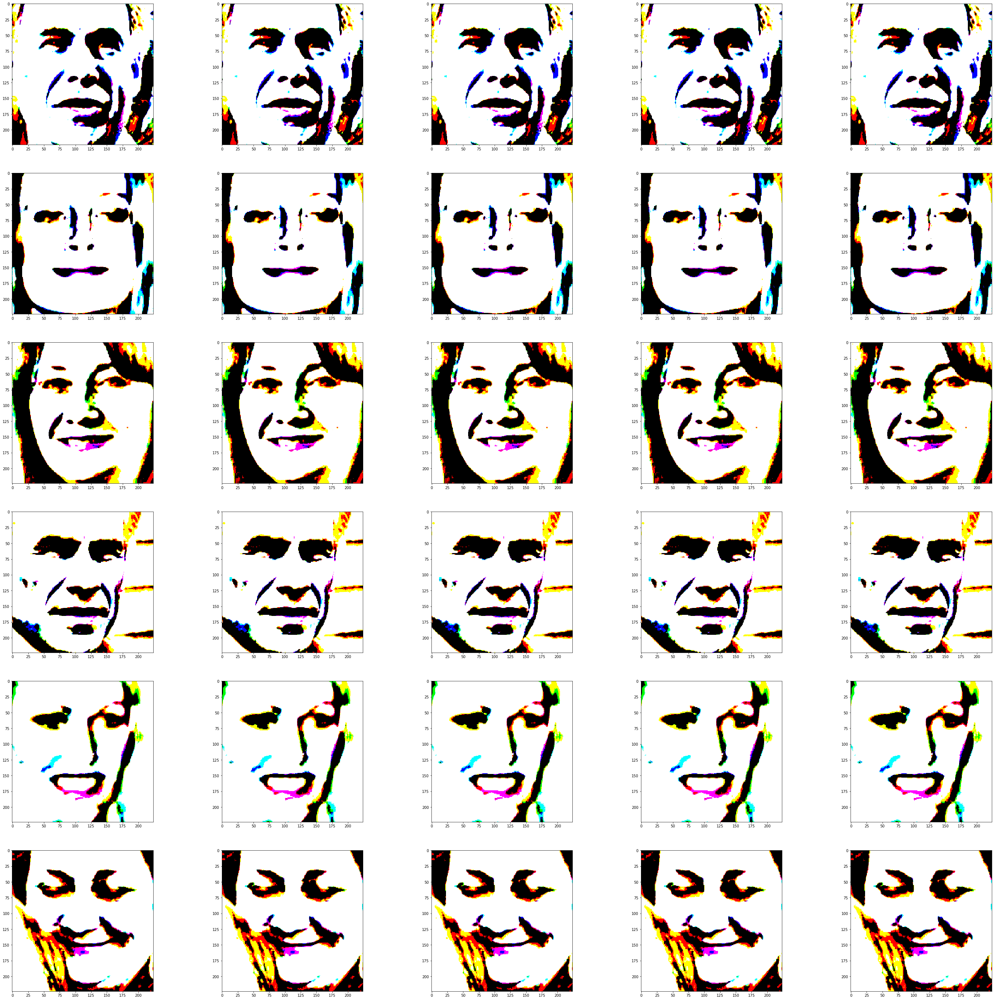

In [59]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))
        img = cv2.addWeighted ( img, 4, cv2.GaussianBlur( img , (0,0) , 30) ,-4 ,128)
        img = np.array(img).astype(np.float)
        img = preprocess_input(img,version=2)
        ax[i, j].imshow(img)

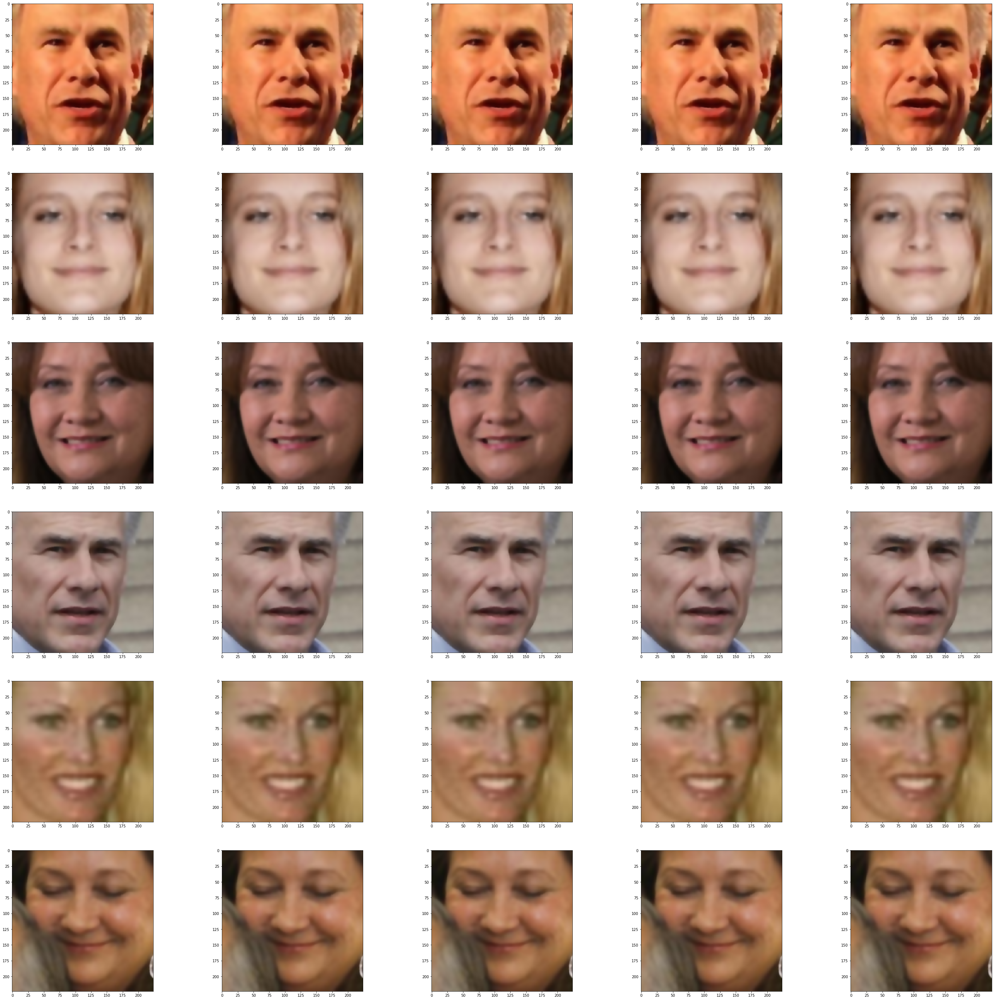

In [65]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))
        img =cv2.bilateralFilter(img,9,100,75)
        # img = cv2.addWeighted ( img, 4, cv2.GaussianBlur( img , (0,0) , 30) ,-4 ,128)
        # img = np.array(img).astype(np.float)
        # img = preprocess_input(img,version=2)
        ax[i, j].imshow(img)


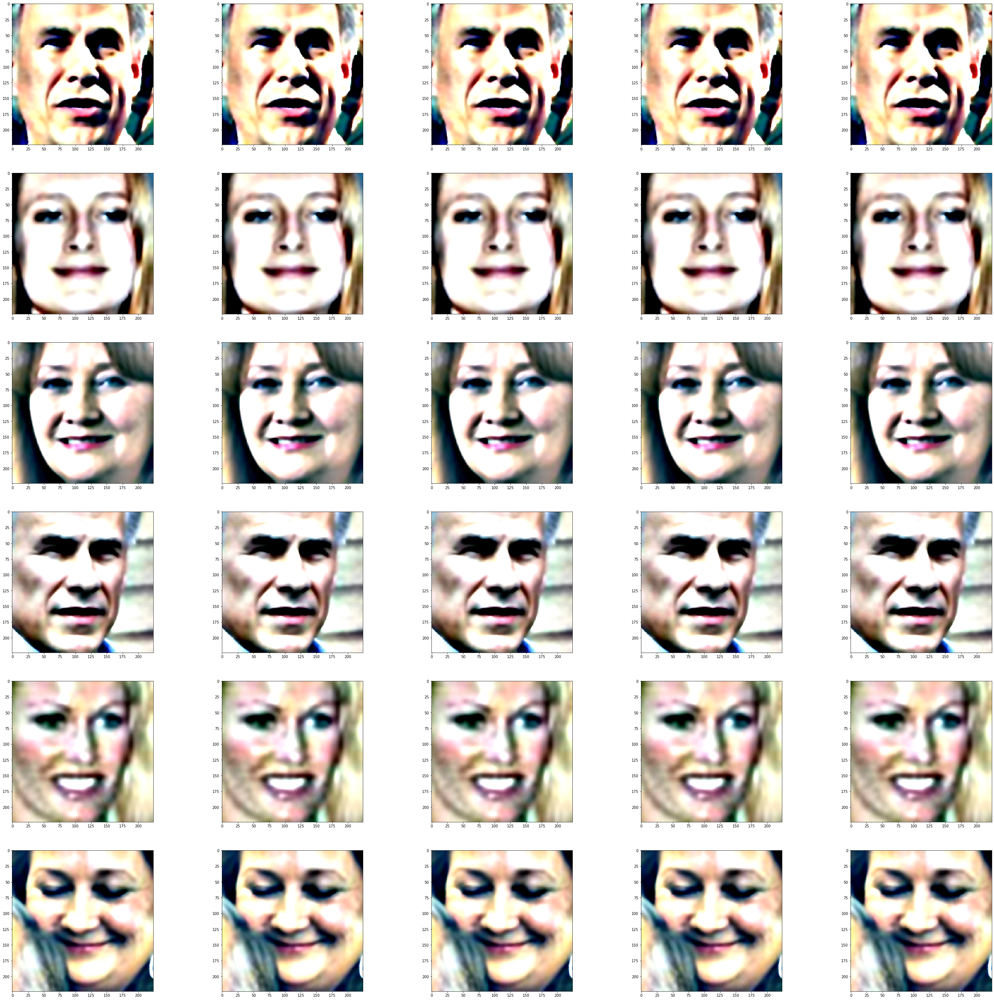

In [66]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))
        img =cv2.bilateralFilter(img,9,100,75)
        img = cv2.addWeighted ( img, 4, cv2.GaussianBlur( img , (0,0) , 30) ,-4 ,128)
        ax[i, j].imshow(img)

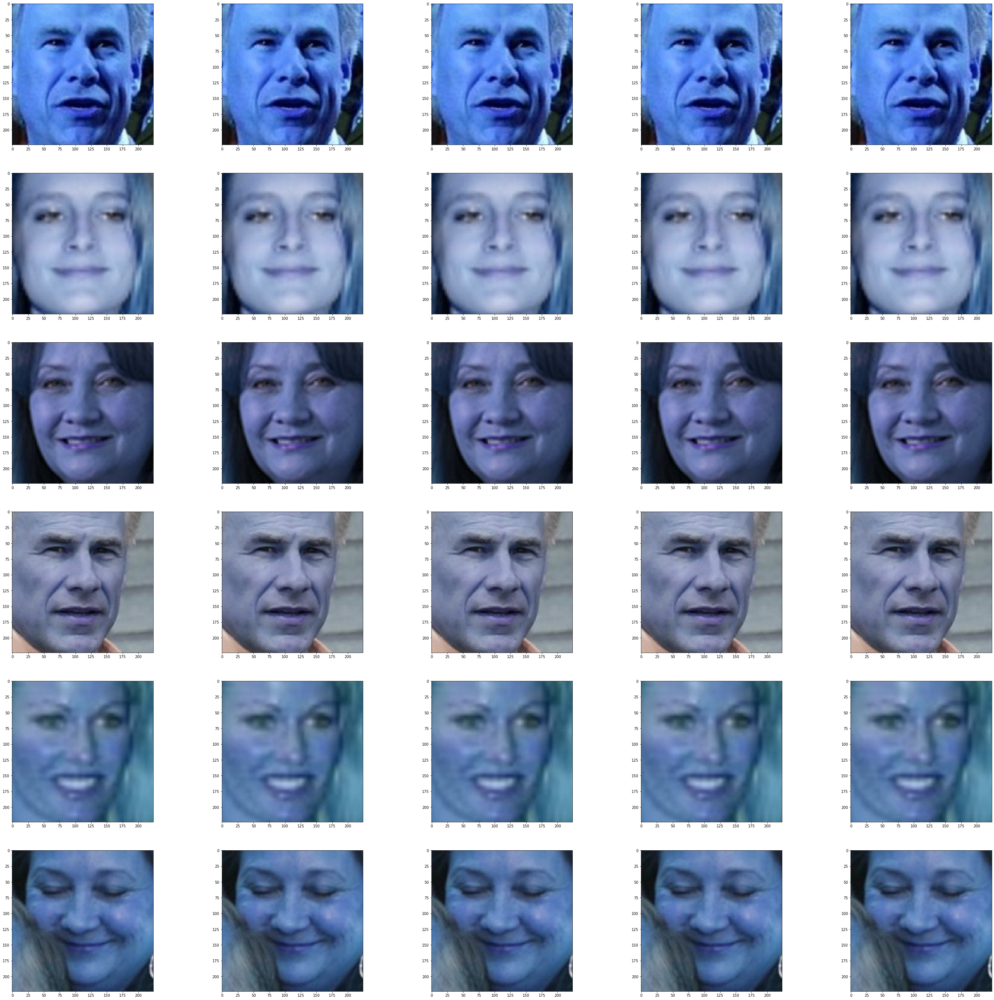

In [71]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        gray = cv2.resize(gray, (224,224))
        gray =cv2.bilateralFilter(gray,9,100,75)
        gray = cv2.Canny(gray,40,55,apertureSize = 3)
        ax[i, j].imshow(img)

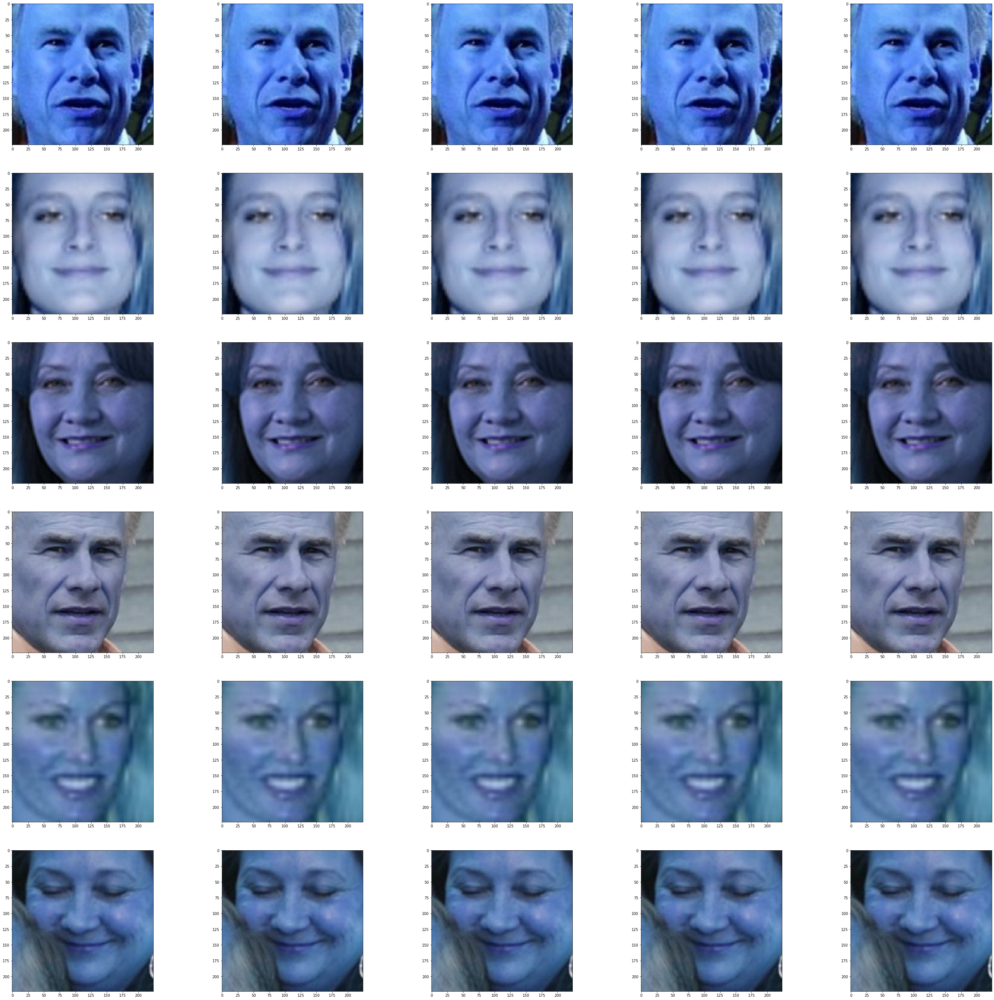

In [72]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        gray = cv2.resize(gray, (224,224))
        gray = cv2.Canny(gray,40,55,apertureSize = 3)
        ax[i, j].imshow(img)

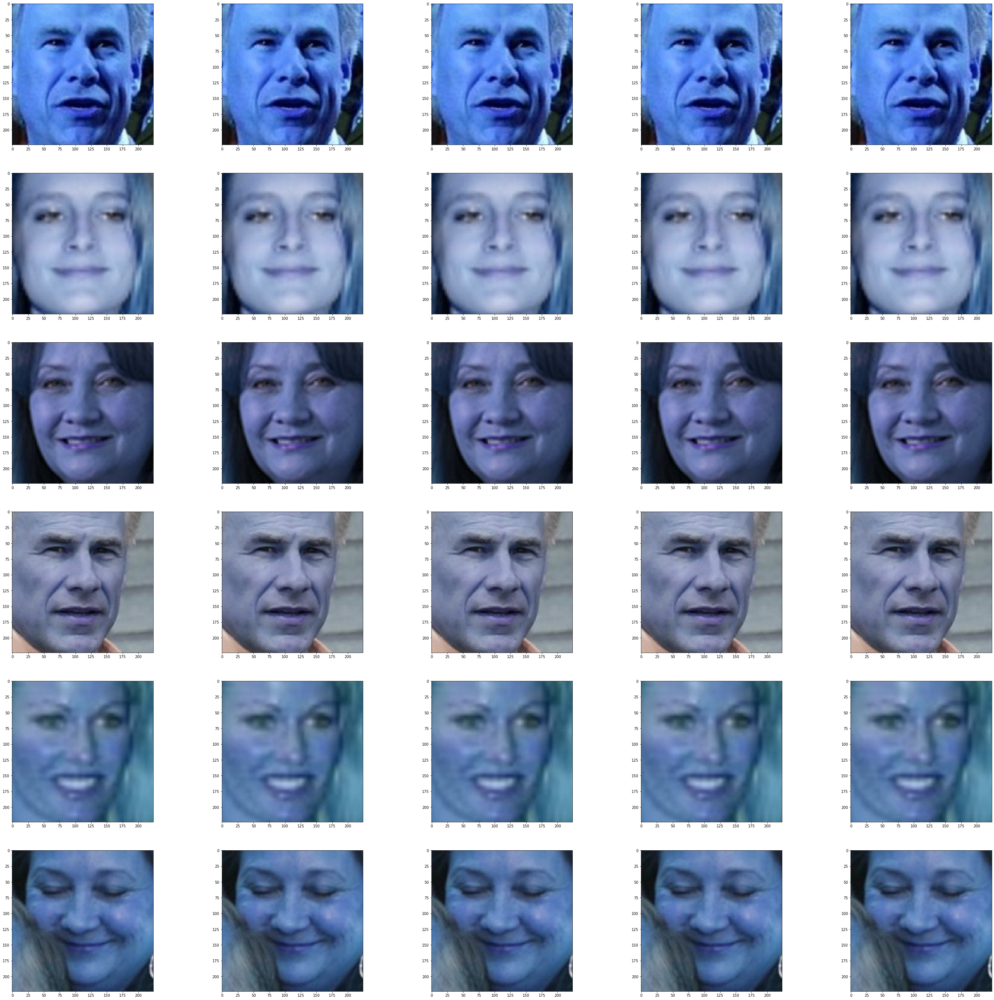

In [103]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        gray = cv2.resize(gray, (224,224))
        gray = cv2.Canny(gray,40,55,apertureSize = 3)
        ax[i, j].imshow(img)

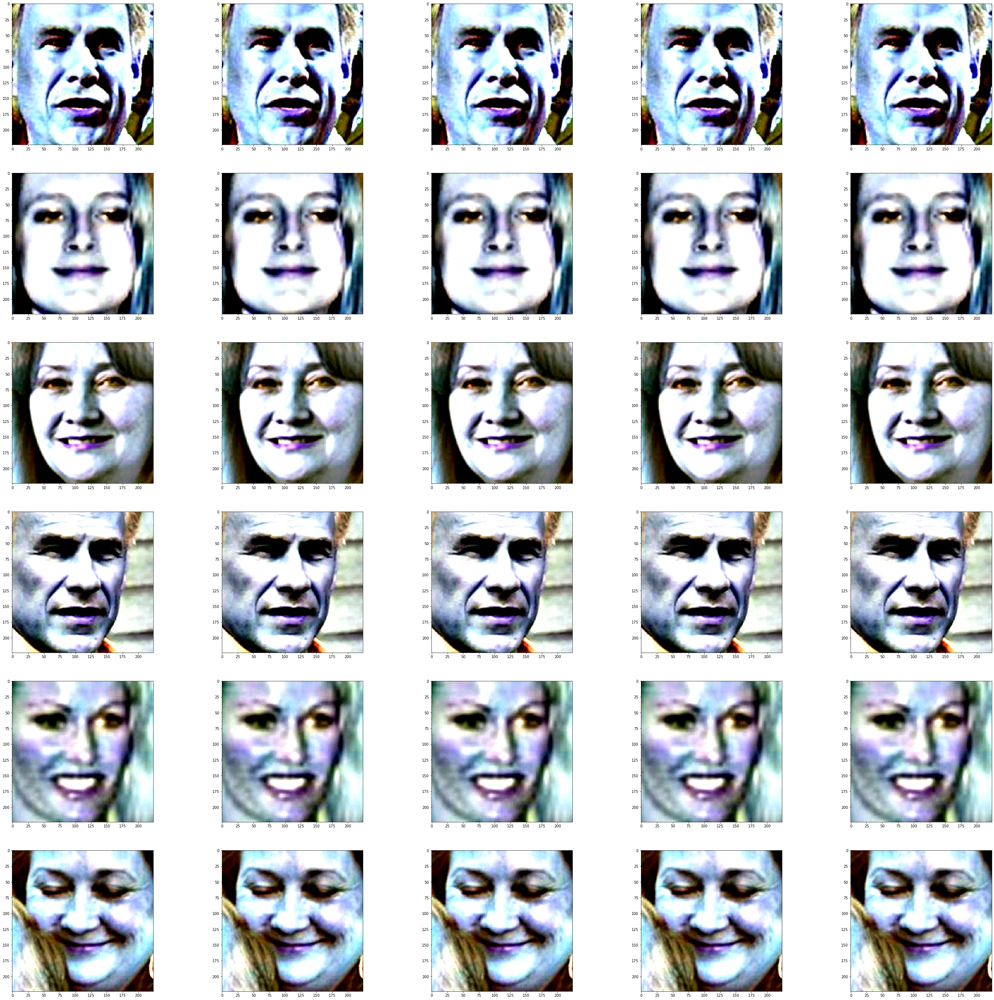

In [105]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        gray = cv2.resize(gray, (224,224))
        gray = cv2.Canny(gray,40,55,apertureSize = 3)
        img = cv2.addWeighted ( img, 4, cv2.GaussianBlur( img , (0,0) , 40) ,-4 ,128)
        ax[i, j].imshow(img)

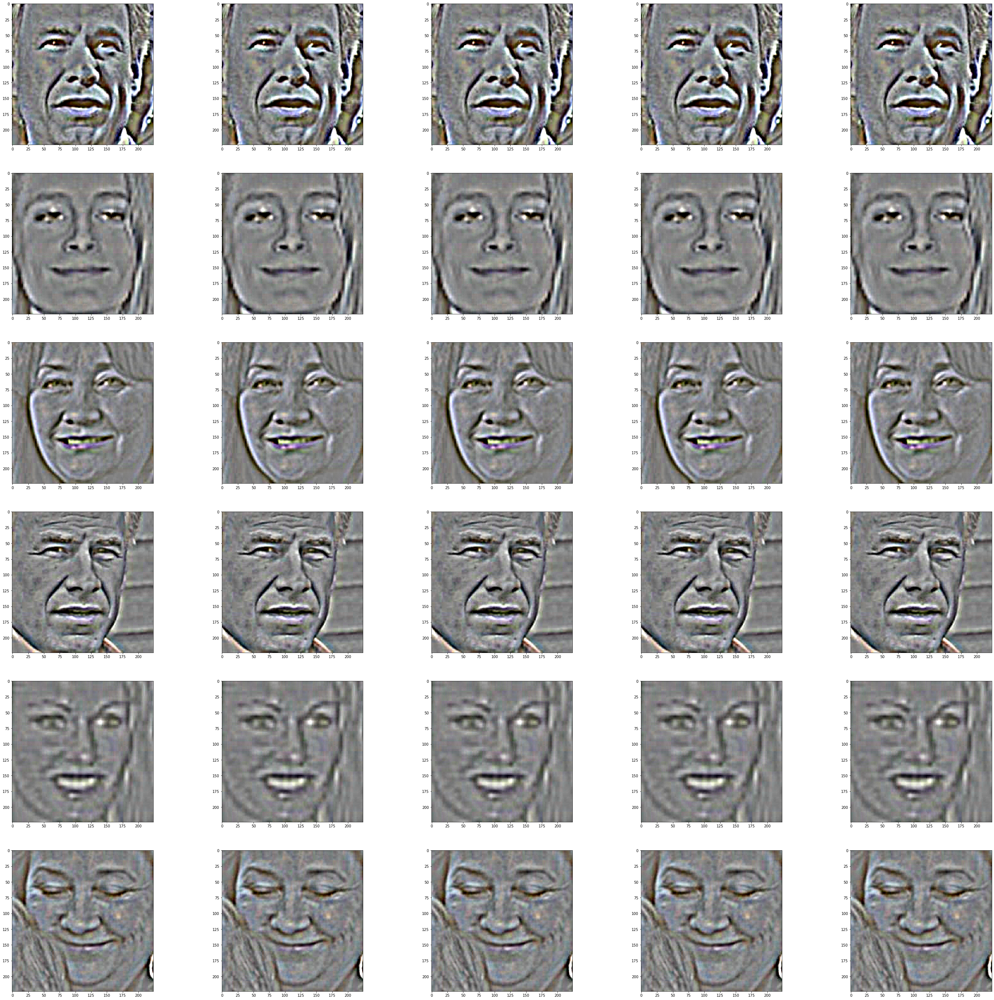

In [109]:
import keras_vggface

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        gray = cv2.resize(gray, (224,224))
        gray = cv2.Canny(gray,40,55,apertureSize = 3)
        img = cv2.addWeighted ( img, 4, cv2.GaussianBlur( img , (0,0) , 5) ,-4 ,128)
        ax[i, j].imshow(img)

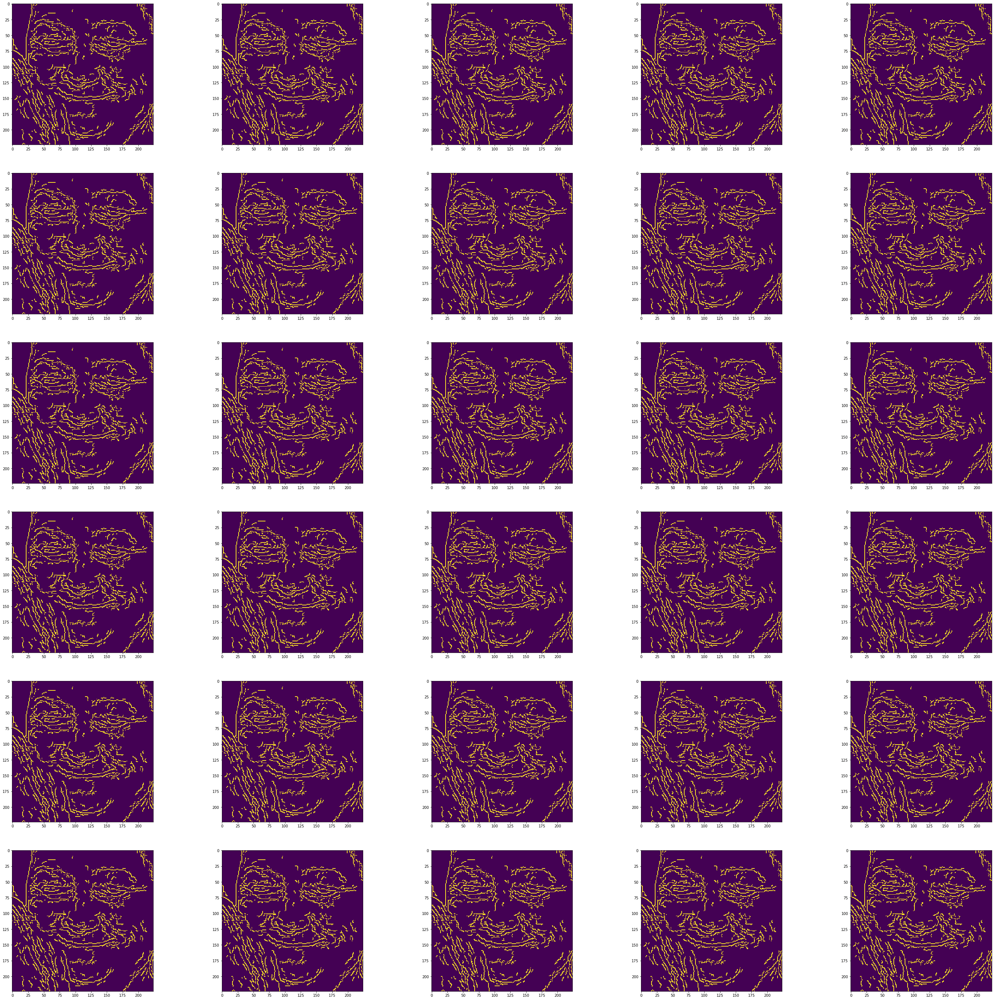

In [111]:
import keras_vggface
from PIL import Image
from numpy import asarray

from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('faces/')
total_files = len(files)

for i in range(6):          
    for j in range(5):
        img = cv2.imread('faces/' + files[i])
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = cv2.resize(gray, (224,224))
        
        pixels = asarray(img)
        # convert from integers to floats
        pixels = pixels.astype('float32')
        # calculate global mean
        mean = pixels.mean()
        # global centering of pixels
        pixels = pixels - mean
        img = Image.fromarray(pixels)

        ax[i, j].imshow(img)
        

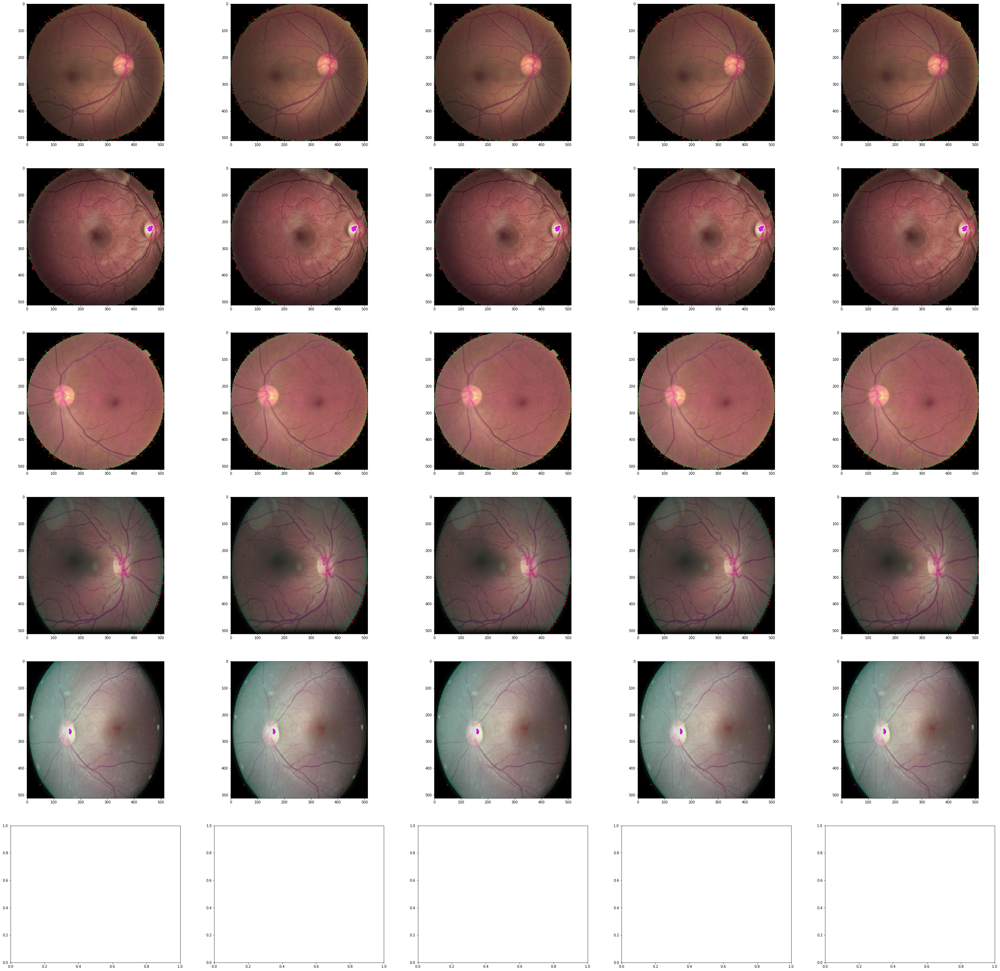

In [44]:

import matplotlib.image as mpimg

fig, ax = plt.subplots(6, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

files = os.listdir('eyes/')
total_files = len(files)

for i in range(5):          
    for j in range(5):  
        img = mpimg.imread('eyes/' + files[i])              
        ax[i, j].imshow(img)

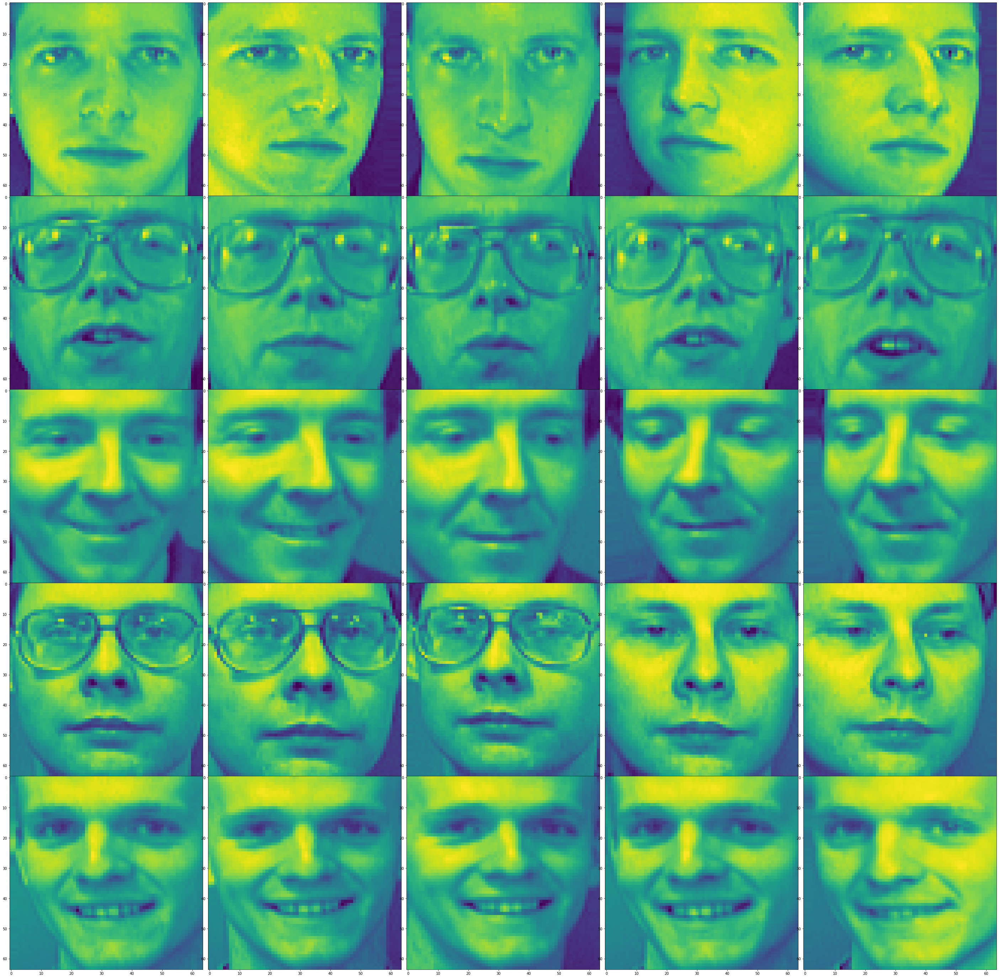

In [31]:
fig, ax = plt.subplots(5, # rows 
                       5,  # columns
                       figsize=(50, 50)) 

fig.subplots_adjust(hspace=0, wspace=0)       

# Get some face data from scikit-learn       
from sklearn.datasets import fetch_olivetti_faces       
faces = fetch_olivetti_faces().images       

for i in range(5):          
    for j in range(5):               
        #ax[i, j].xaxis.set_major_locator(plt.NullLocator())               
        #ax[i, j].yaxis.set_major_locator(plt.NullLocator())               
        ax[i, j].imshow(faces[10 * i + j])
        
        

In [22]:
w=50
h=50
fig=plt.figure(figsize=(8, 8))
columns = 4
rows = 5

<Figure size 576x576 with 0 Axes>